In [1]:
import os
print(os.getcwd())
os.listdir()

/tf/DATAMAN/Damage_part


['val_images',
 'train_images',
 '.ipynb_checkpoints',
 'train_labels',
 'there_are_5_classes_here.txt',
 'Untitled.ipynb',
 'val_labels',
 'train.zip',
 'val.zip',
 'test.zip']

In [2]:
import os

base_path = '.' 
for split in ['train', 'val']:
    img_dir = os.path.join(base_path, f'{split}_images')
    label_dir = os.path.join(base_path, f'{split}_labels')
    
    n_images = len([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    n_labels = len([f for f in os.listdir(label_dir) if f.endswith('.txt')])
    
    print(f'{split}: {n_images} images, {n_labels} label files')

train: 2816 images, 2816 label files
val: 810 images, 810 label files


In [4]:
sample_label_dir = os.path.join(base_path, 'train_labels')
sample_files = sorted([f for f in os.listdir(sample_label_dir) if f.endswith('.txt')])[:3]

for fname in sample_files:
    path = os.path.join(sample_label_dir, fname)
    print(f'--- {fname} ---')
    with open(path, 'r') as f:
        print(f.read())

--- 000001.txt ---
1 0.268435 0.141173 0.202790 0.175120
5 0.502755 0.517280 0.684190 0.734693

--- 000002.txt ---
5 0.675330 0.621229 0.397200 0.519760

--- 000003.txt ---
5 0.677145 0.390645 0.645710 0.781289



In [5]:
from collections import Counter
import os

def count_classes(label_dir):
    counter = Counter()
    for fname in os.listdir(label_dir):
        if not fname.endswith('.txt'):
            continue
        path = os.path.join(label_dir, fname)
        with open(path, 'r') as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                class_id = int(line.split()[0])
                counter[class_id] += 1
    return counter

train_counts = count_classes(os.path.join(base_path, 'train_labels'))
val_counts = count_classes(os.path.join(base_path, 'val_labels'))

print('Train class distribution:')
for cls, count in sorted(train_counts.items()):
    print(f'  Class {cls}: {count} instances')

print('\nVal class distribution:')
for cls, count in sorted(val_counts.items()):
    print(f'  Class {cls}: {count} instances')

print(f'\nUnique classes found overall: {sorted(set(train_counts) | set(val_counts))}')

Train class distribution:
  Class 0: 1806 instances
  Class 1: 2560 instances
  Class 2: 651 instances
  Class 3: 475 instances
  Class 4: 494 instances
  Class 5: 225 instances

Val class distribution:
  Class 0: 501 instances
  Class 1: 728 instances
  Class 2: 177 instances
  Class 3: 135 instances
  Class 4: 141 instances
  Class 5: 62 instances

Unique classes found overall: [0, 1, 2, 3, 4, 5]


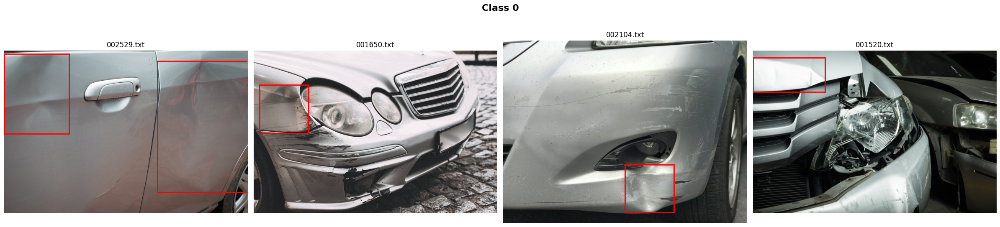

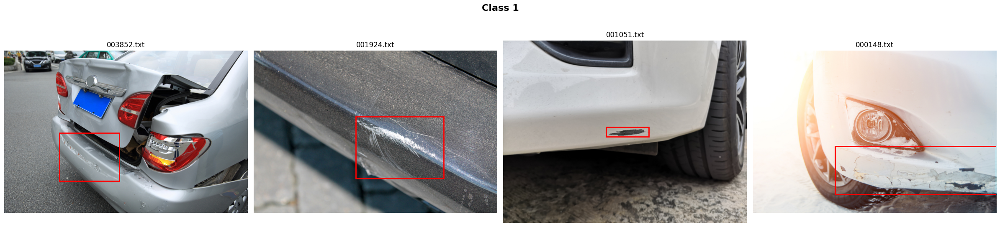

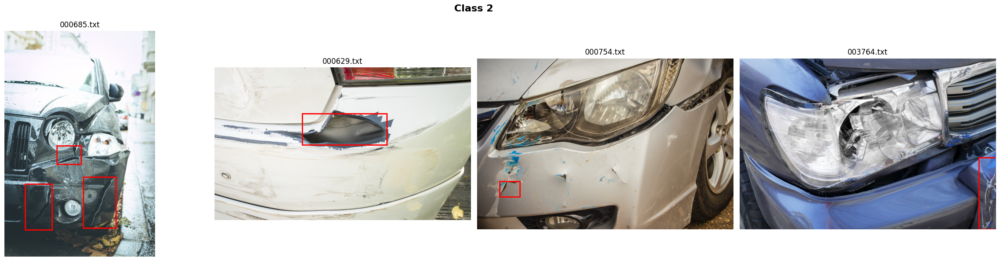

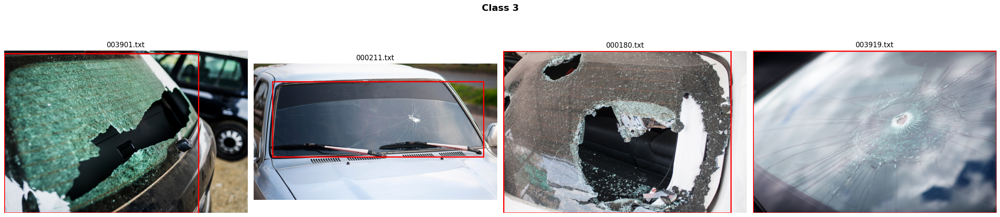

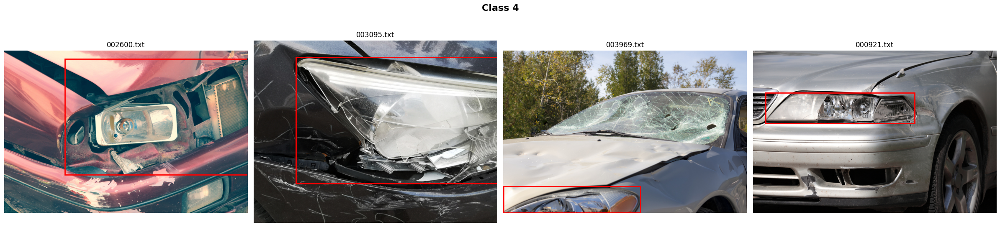

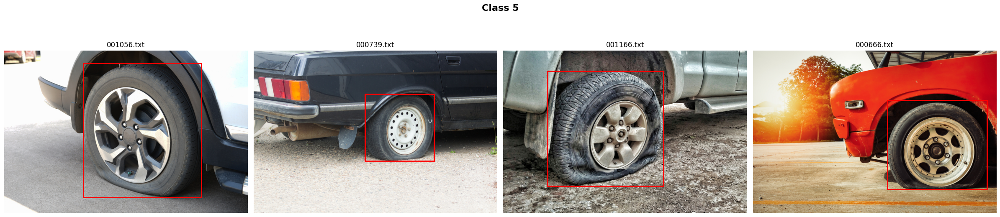

In [7]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os
import random

def find_samples_per_class(label_dir, img_dir, n_samples=3):
    """מוצא עד n_samples תמונות לכל class"""
    class_to_files = {}
    
    for fname in os.listdir(label_dir):
        if not fname.endswith('.txt'):
            continue
        path = os.path.join(label_dir, fname)
        with open(path, 'r') as f:
            lines = f.readlines()
        
        classes_in_file = set()
        for line in lines:
            line = line.strip()
            if line:
                classes_in_file.add(int(line.split()[0]))
        
        for cls in classes_in_file:
            class_to_files.setdefault(cls, []).append(fname)
    
    samples = {}
    for cls, files in class_to_files.items():
        random.shuffle(files)
        samples[cls] = files[:n_samples]
    
    return samples

def show_class_samples(cls, filenames, label_dir, img_dir):
    fig, axes = plt.subplots(1, len(filenames), figsize=(6*len(filenames), 6))
    if len(filenames) == 1:
        axes = [axes]
    
    fig.suptitle(f'Class {cls}', fontsize=16, fontweight='bold')
    
    for ax, fname in zip(axes, filenames):
        base = fname.replace('.txt', '')
        img_path = None
        for ext in ['.jpg', '.jpeg', '.png']:
            candidate = os.path.join(img_dir, base + ext)
            if os.path.exists(candidate):
                img_path = candidate
                break
        
        if img_path is None:
            continue
        
        img = Image.open(img_path)
        W, H = img.size
        ax.imshow(img)
        
        with open(os.path.join(label_dir, fname), 'r') as f:
            for line in f:
                parts = line.strip().split()
                if not parts:
                    continue
                c, xc, yc, w, h = int(parts[0]), *map(float, parts[1:5])
                if c != cls:
                    continue
                x1 = (xc - w/2) * W
                y1 = (yc - h/2) * H
                rect = patches.Rectangle((x1, y1), w*W, h*H, 
                                          linewidth=2, edgecolor='red', facecolor='none')
                ax.add_patch(rect)
        
        ax.set_title(fname)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# הרצה
label_dir = os.path.join(base_path, 'train_labels')
img_dir = os.path.join(base_path, 'train_images')

samples = find_samples_per_class(label_dir, img_dir, n_samples=4)

for cls in sorted(samples.keys()):
    show_class_samples(cls, samples[cls], label_dir, img_dir)

In [8]:
from PIL import Image
import os

def check_corrupt_images(img_dir):
    corrupt = []
    for fname in os.listdir(img_dir):
        if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        path = os.path.join(img_dir, fname)
        try:
            img = Image.open(path)
            img.verify()
        except Exception as e:
            corrupt.append((fname, str(e)))
    return corrupt

for split in ['train', 'val']:
    corrupt = check_corrupt_images(os.path.join(base_path, f'{split}_images'))
    print(f'{split}: {len(corrupt)} corrupt images')
    if corrupt:
        print(corrupt[:5])

train: 0 corrupt images
val: 0 corrupt images


In [9]:
def validate_labels(label_dir):
    issues = []
    for fname in os.listdir(label_dir):
        if not fname.endswith('.txt'):
            continue
        with open(os.path.join(label_dir, fname)) as f:
            for i, line in enumerate(f):
                parts = line.strip().split()
                if not parts:
                    continue
                if len(parts) != 5:
                    issues.append((fname, i, 'wrong number of values', line))
                    continue
                cls = int(parts[0])
                coords = list(map(float, parts[1:5]))
                if cls < 0 or cls > 5:
                    issues.append((fname, i, 'class out of range', line))
                if any(c < 0 or c > 1 for c in coords):
                    issues.append((fname, i, 'coord out of range', line))
    return issues

for split in ['train', 'val']:
    issues = validate_labels(os.path.join(base_path, f'{split}_labels'))
    print(f'{split}: {len(issues)} label issues')
    if issues:
        print(issues[:5])

train: 0 label issues
val: 0 label issues


In [10]:
def check_matching(img_dir, label_dir):
    img_names = {os.path.splitext(f)[0] for f in os.listdir(img_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))}
    label_names = {os.path.splitext(f)[0] for f in os.listdir(label_dir) if f.endswith('.txt')}
    
    missing_labels = img_names - label_names
    missing_images = label_names - img_names
    return missing_labels, missing_images

for split in ['train', 'val']:
    missing_labels, missing_images = check_matching(
        os.path.join(base_path, f'{split}_images'),
        os.path.join(base_path, f'{split}_labels')
    )
    print(f'{split}: {len(missing_labels)} images without labels, {len(missing_images)} labels without images')

train: 0 images without labels, 0 labels without images
val: 0 images without labels, 0 labels without images


In [11]:
def count_empty_labels(label_dir):
    empty = 0
    for fname in os.listdir(label_dir):
        if not fname.endswith('.txt'):
            continue
        path = os.path.join(label_dir, fname)
        if os.path.getsize(path) == 0:
            empty += 1
    return empty

for split in ['train', 'val']:
    n_empty = count_empty_labels(os.path.join(base_path, f'{split}_labels'))
    print(f'{split}: {n_empty} empty label files')

train: 0 empty label files
val: 0 empty label files


In [12]:
from PIL import Image
import random

sample = random.sample(os.listdir(os.path.join(base_path, 'train_images')), 20)
for fname in sample:
    img = Image.open(os.path.join(base_path, 'train_images', fname))
    print(fname, img.size)

003484.jpg (1000, 667)
000500.jpg (1000, 751)
002282.jpg (1000, 662)
001165.jpg (1000, 667)
001458.jpg (1000, 751)
003070.jpg (1000, 750)
002901.jpg (1000, 733)
003501.jpg (1000, 667)
001817.jpg (667, 1000)
002796.jpg (1000, 750)
001995.jpg (1000, 667)
001190.jpg (1000, 667)
000815.jpg (1000, 667)
000145.jpg (667, 1000)
003621.jpg (1000, 563)
001616.jpg (1000, 667)
000765.jpg (1000, 668)
000474.jpg (1000, 750)
002696.jpg (1000, 667)
002371.jpg (1000, 664)


In [14]:
import hashlib

def hash_images(img_dir):
    hashes = {}
    for fname in os.listdir(img_dir):
        if not fname.lower().endswith(('.jpg','.jpeg','.png')):
            continue
        path = os.path.join(img_dir, fname)
        with open(path, 'rb') as f:
            h = hashlib.md5(f.read()).hexdigest()
        hashes[h] = fname
    return hashes

train_hashes = hash_images(os.path.join(base_path, 'train_images'))
val_hashes = hash_images(os.path.join(base_path, 'val_images'))

overlap = set(train_hashes) & set(val_hashes)
print(f'Identical images in both train and val: {len(overlap)}')

Identical images in both train and val: 0


In [15]:
import torch
print('CUDA available:', torch.cuda.is_available())
if torch.cuda.is_available():
    print('GPU:', torch.cuda.get_device_name(0))
    print('Memory:', torch.cuda.get_device_properties(0).total_memory / 1e9, 'GB')

CUDA available: True
GPU: NVIDIA GeForce RTX 3090
Memory: 25.216745472 GB
